# Downloading the Data from Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [1]:
DATASET_PATH = "/content/Avantari ML/"

In [2]:
%%writefile download_data.sh
if [ -d "$1" ]; then
    echo "Data is available at $1"
    cd "$1"
else
    mkdir "$1"
    cd "$1"
    unzip "/content/drive/My Drive/Avantari ML/dataset.zip"
    echo "Data Downloaded"
    
fi

Overwriting download_data.sh


In [3]:
!sh download_data.sh "{DATASET_PATH}"
%cd "{DATASET_PATH}"

Data is available at /content/Avantari ML/
/content/Avantari ML


# Importing Libriaries

In [1]:
import os
import glob
from PIL import Image
from random import shuffle
from typing import *
import matplotlib.pyplot as plt
import numpy as np
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import collections
import torchvision.transforms as transforms
import torchvision.models as models
from functools import partial
import gc
from torch.autograd import Function
from torch.nn.modules.distance import PairwiseDistance
from tqdm import tqdm
from itertools import combinations
from torchsummary import summary
import time
import pickle as pkl
import torchvision
import pandas as pd
import warnings

warnings.filterwarnings('ignore')

In [5]:
#config to set the Paramters
BATCH_SIZE = 64
NUM_WORKERS = 8
SIZE = (224, 224)
DEVICE = 'cuda:0' if torch.cuda.is_available() else 'cpu'

# Defining The PyTorch Dataset

In [6]:

def read_image(img_path: str, size: Optional[Union[int, Tuple[int, int]]] = None) -> Image:
    """
    Function to read the Image from a given path and resize it to a specific size

    params :
        img_path - string - contains the path of image
        size - Tuple - contains the height and width or integer indicating same height and width

    returns :
        A PIL.Image ytpe containing the required image
    """
    img = Image.open(img_path).convert("RGB")
    if size is not None:
        if isinstance(size, tuple) : 
            img = img.resize(size)
        elif isinstance(size, int) : 
            img = img.resize((size, size))
        else : 
            raise Exception(f"Invalid size argument for read_image : {size}")
    return img


class ImageDataset(Dataset):
    def __init__(self, image_paths: str, transform: Collection[Callable] = None,
                 size: Optional[Union[int, Tuple[int, int]]] = None ) :
        super(ImageDataset, self).__init__()
        self.image_paths = image_paths
        self.transform = transform
        self.size = size

    def __len__(self) -> int:
        return len(self.image_paths)

    def __getitem__(self, index: int) -> Dict[str, Any]:
        img_path = self.image_paths[index]
        img = read_image(img_path, self.size)
        img = self.transform(img)

        return {
            'image': img,
            'image_path': img_path
        }


## Reading the File Names

In [7]:
def get_file_names(path:str) -> List[str] : 
    """
    To get all the file names from given pattern using glob

    params : 
        path - string - contains the path pattern

    returns : 
        A List containing all the paths that satisfies the given pattern
    """ 
    img_paths = glob.glob(path)
    shuffle(img_paths)
    return img_paths

img_paths = get_file_names("/content/Avantari ML/dataset/*.jpg")

## Creating the Dataset & DataLoader

In [8]:
tfs = transforms.Compose(
    [
        transforms.ToTensor(),
    ]
)
dataset = ImageDataset(img_paths, tfs, size = SIZE)
dataset[1]['image'].shape

torch.Size([3, 224, 224])

In [9]:
dataloader = DataLoader(dataset, shuffle = True, num_workers = NUM_WORKERS, 
                              batch_size=BATCH_SIZE)

## Creating The Model

In [10]:
model = models.vgg19(pretrained = True).to(DEVICE)
model.eval()
summary(model, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
            Conv2d-3         [-1, 64, 224, 224]          36,928
              ReLU-4         [-1, 64, 224, 224]               0
         MaxPool2d-5         [-1, 64, 112, 112]               0
            Conv2d-6        [-1, 128, 112, 112]          73,856
              ReLU-7        [-1, 128, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]         147,584
              ReLU-9        [-1, 128, 112, 112]               0
        MaxPool2d-10          [-1, 128, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]         295,168
             ReLU-12          [-1, 256, 56, 56]               0
           Conv2d-13          [-1, 256, 56, 56]         590,080
             ReLU-14          [-1, 256,

# Extracting Features From the Model

In [12]:
class SaveFeatures() : 
    """
    To get the Image Embeddings from the model using PyTorch Hooks

    """
    features=None
    def __init__(self, m : nn.Module): 
        self.hook = m.register_forward_hook(self.hook_fn)
        self.features = None
    def hook_fn(self, module : nn.Module, input : torch.Tensor, output:torch.Tensor) : 
        """
        To process the output of the layer to which the hook is registered
        """ 
        out = output.detach().squeeze().cpu().numpy()
        if isinstance(self.features, type(None)):
            self.features = out
        else:
            self.features = np.row_stack((self.features, out))
    def remove(self): 
        """
        To remove the Hook
        """
        self.hook.remove()


In [11]:
list(model.children())[-1][4] #Taking Output from ReLU-43 Layer

ReLU(inplace=True)

In [13]:
#Registering The Hook to get embeddings from Vgg19 Model
sf = SaveFeatures(list(model.children())[-1][4])

In [14]:
paths = []
with torch.no_grad() : 
    for batch in tqdm(dataloader) : 
       model(batch['image'].to(DEVICE))
       paths.extend(batch['image_path'])
    
features = sf.features

100%|██████████| 63/63 [00:42<00:00,  1.48it/s]


In [16]:
np.save('features.npy', features)
with open('image_paths.pkl', 'wb')  as f : 
    pkl.dump(paths, f)

In [20]:
features_df = pd.DataFrame([paths, features]).T
features_df.shape

(4738, 2)

In [21]:
features_df['img_path'] = features_df[0].apply(lambda x: x.split('/')[-1])
features_df.columns = ['FullPath', 'Features', 'ImageName']
with open('features.pkl', 'wb') as f : 
    pkl.dump(features_df, f)
features_df.head()

,FullPath,Features,ImageName
0,/content/Avantari ML/dataset/2031.jpg,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.07423815, 0.2...",2031.jpg
1,/content/Avantari ML/dataset/3069.jpg,"[0.0, 0.0, 0.0, 0.0, 0.43415886, 0.0, 0.0, 0.0...",3069.jpg
2,/content/Avantari ML/dataset/1013.jpg,"[0.0, 0.0, 0.38455546, 0.0, 0.0, 0.0, 0.839555...",1013.jpg
3,/content/Avantari ML/dataset/106.jpg,"[0.0, 0.0, 0.0, 0.0, 0.76334864, 0.0, 0.673466...",106.jpg
4,/content/Avantari ML/dataset/904.jpg,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.17127545, 0.0...",904.jpg


In [22]:
!cp -r "/content/Avantari ML/features.pkl" "/content/drive/My Drive/Avantari ML/"

In [2]:
with open('/content/drive/My Drive/Avantari ML/features.pkl', 'rb') as f : 
    features_df = pkl.load(f)
features_df.sample(10)

,FullPath,Features,ImageName
2897,/content/Avantari ML/dataset/4328.jpg,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.3540311, 0.98...",4328.jpg
708,/content/Avantari ML/dataset/1201.jpg,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.503518, 0.0, ...",1201.jpg
98,/content/Avantari ML/dataset/1518.jpg,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.055838652, 2....",1518.jpg
1514,/content/Avantari ML/dataset/2278.jpg,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.4506506,...",2278.jpg
3777,/content/Avantari ML/dataset/3361.jpg,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.991277, ...",3361.jpg
4505,/content/Avantari ML/dataset/3838.jpg,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3840742,...",3838.jpg
2866,/content/Avantari ML/dataset/2584.jpg,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.320149, 0.0, ...",2584.jpg
2036,/content/Avantari ML/dataset/4050.jpg,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",4050.jpg
634,/content/Avantari ML/dataset/346.jpg,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.1557138,...",346.jpg
2818,/content/Avantari ML/dataset/634.jpg,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.2355748,...",634.jpg


# Building Annoy Tree to find The Neighbours

In [24]:
try : 
    from annoy import AnnoyIndex
except : 
    !pip install --upgrade annoy
    from annoy import AnnoyIndex


     |████████████████████████████████| 645kB 4.8MB/s 
  Created wheel for annoy: filename=annoy-1.16.3-cp36-cp36m-linux_x86_64.whl size=297333 sha256=1df0fd13f7bc62dfb55bcccd77adefb744dc230750966d8c046dbc8379004865
  Stored in directory: /root/.cache/pip/wheels/f3/01/54/6ef760fe9f9fc6ba8c19cebbe6358212b5f3b5b0195c0b813f
Successfully built annoy


In [25]:
def build_tree(features, feature_len = 4096, ntree = 500) : 
    annoy_tree = AnnoyIndex(feature_len, metric='euclidean')
    for i, vector in tqdm(enumerate(features)):
        annoy_tree.add_item(i, vector)
    _  = annoy_tree.build(ntree)
    return annoy_tree

search_tree = build_tree(features_df['Features'])

4738it [00:02, 1968.33it/s]


In [28]:
search_tree.save('/content/drive/My Drive/Avantari ML/annoy_tree.ann')

True

In [29]:
import time
def get_similar_images_annoy(img_index, tree = search_tree, neighbours = 100, print_time = True):
    start = time.time()
    base_img_id, base_vector, _  = features_df.iloc[img_index]
    similar_img_ids = tree.get_nns_by_item(img_index, neighbours)
    end = time.time()
    if print_time : print(f'Took {(end - start) * 1000} ms for Neighbour Retrieval')
    return base_img_id, features_df.iloc[similar_img_ids].reset_index(drop = True)

def get_similar_images_annoy_by_feat(img_vector, tree = search_tree, neighbours = 100, print_time = True):
    start = time.time()
    similar_img_ids = tree.get_nns_by_vector(img_vector, neighbours)
    end = time.time()
    if print_time : print(f'Took {(end - start) * 1000} ms for Neighbour Retrieval')
    return features_df.iloc[similar_img_ids].reset_index(drop = True)

In [30]:
def save_image_grid(image_df, path) : 
    images = []
    to_tensor = transforms.ToTensor()
    for i, row in image_df.iterrows() : 
        img = read_image(row['FullPath'], SIZE)
        img = to_tensor(img)
        images.append(img)
    images = torch.stack(images)
    images = torchvision.utils.save_image(images, nrow = 10, fp = path)
    return images

In [15]:
def plot_images(base_image = None, image_df = None, cols = 10) : 

    if base_image is not None : 
        img = read_image(base_image, SIZE)
        plt.imshow(img)
    n_items = len(image_df) - 1
    columns = cols
    rows = int(np.ceil(n_items+1/columns))
    fig=plt.figure(figsize=(rows, 10*rows))
    for i in range(rows):
        for j in range(columns):
            try : 
                img = read_image(image_df.loc[i+j+1, 'FullPath'], SIZE)
                fig.add_subplot(rows, columns, i+j+1)
                plt.imshow(img)
            except : 
                pass
    return plt.show() 


In [ ]:
# To save the Neighbours as a Image Grid
sample = get_similar_images_annoy(i, print_time = False)
save_image_grid(sample[1], f"grid_{features_df.loc[i, 'ImageName']}")

# Plotting The Neighbours for Sample Images

Took 71.58136367797852 ms for Neighbour Retrieval


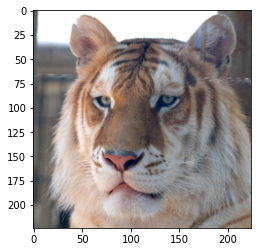

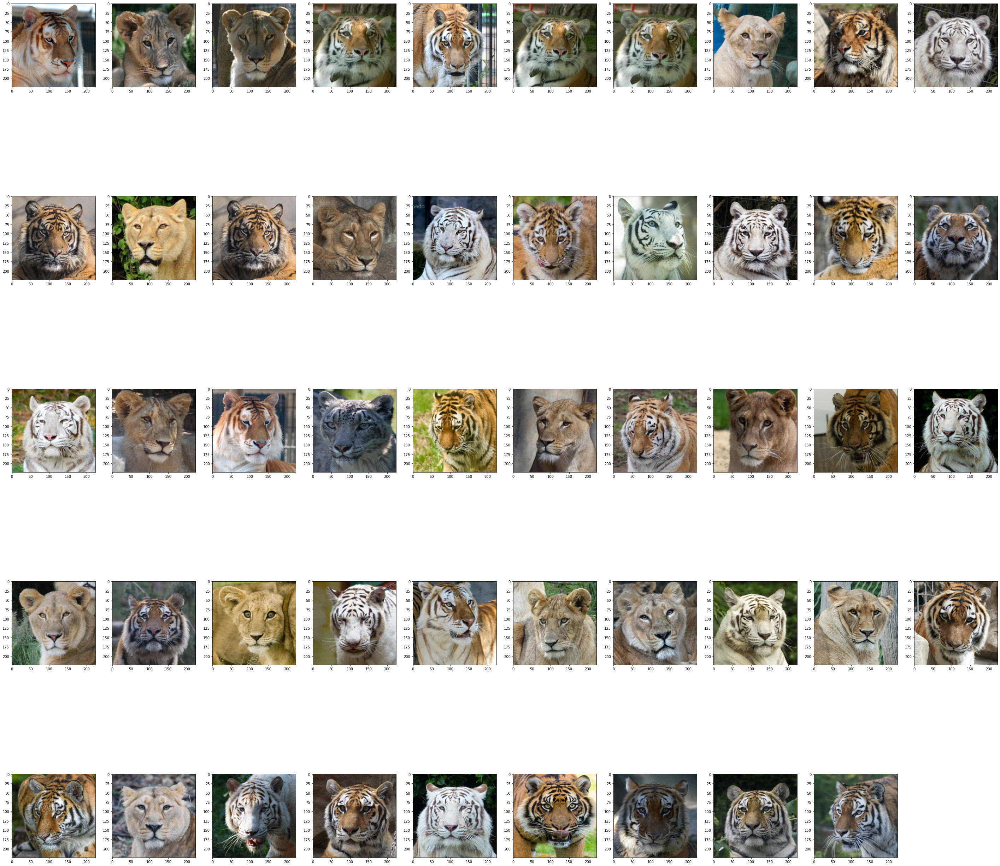

In [34]:
sample = get_similar_images_annoy(3, neighbours = 50)
plot_images(*sample)

Took 10.025978088378906 ms for Neighbour Retrieval


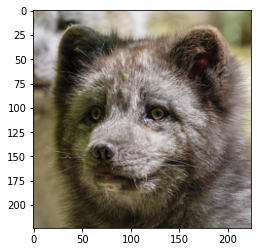

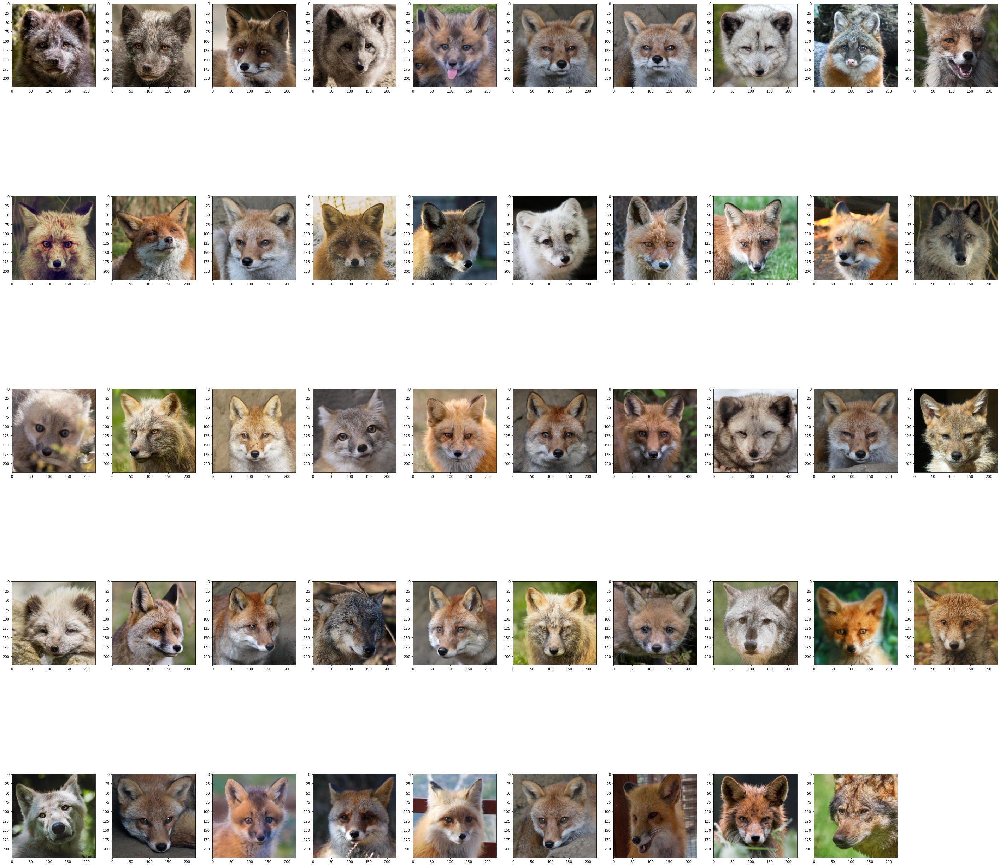

In [35]:
sample = get_similar_images_annoy(0, neighbours = 50)
plot_images(*sample)

In [39]:
def get_similar_images(img_path, sf) : 
    img = read_image(img_path, SIZE)
    img = transforms.ToTensor()(img)
    img.unsqueeze_(dim = 0)
    with torch.no_grad() :
        model.eval()
        model(img.to(DEVICE))
        out = sf.features
    
    sample = get_similar_images_annoy_by_feat(out, neighbours = 50)
    plot_images(img_path, sample)

In [ ]:
sf.remove()
#Registering The Hook to get embeddings from MobileNet Model
sf = SaveFeatures(list(model.children())[-1][4])
get_similar_images('/content/Avantari ML/dataset/1002.jpg', sf)

In [ ]:
sf.remove()
#Registering The Hook to get embeddings from MobileNet Model
sf = SaveFeatures(list(model.children())[-1][4])
get_similar_images('/content/Avantari ML/dataset/998.jpg', sf)

# Extracting The Neighbours for Submission

In [36]:
neighbours = {}
for i in range(len(features_df)) : 
    sample = get_similar_images_annoy(i, print_time = False)
    neighbours[features_df.loc[i, 'ImageName']] = sample[1]['ImageName'].tolist()
    if i%1000 == 0 : print(f"{i} Images Processed Successfully")

0 Images Processed Successfully
1000 Images Processed Successfully
2000 Images Processed Successfully
3000 Images Processed Successfully
4000 Images Processed Successfully


In [37]:
neighbours_df = pd.DataFrame(neighbours).T
neighbours_df.columns = ['neighbour_'+str(i) for i in neighbours_df.columns]
neighbours_df = neighbours_df.reset_index().rename(columns = {'index' : 'image'})
neighbours_df

,image,neighbour_0,neighbour_1,neighbour_2,neighbour_3,neighbour_4,neighbour_5,neighbour_6,neighbour_7,neighbour_8,neighbour_9,neighbour_10,neighbour_11,neighbour_12,neighbour_13,neighbour_14,neighbour_15,neighbour_16,neighbour_17,neighbour_18,neighbour_19,neighbour_20,neighbour_21,neighbour_22,neighbour_23,neighbour_24,neighbour_25,neighbour_26,neighbour_27,neighbour_28,neighbour_29,neighbour_30,neighbour_31,neighbour_32,neighbour_33,neighbour_34,neighbour_35,neighbour_36,neighbour_37,neighbour_38,...,neighbour_60,neighbour_61,neighbour_62,neighbour_63,neighbour_64,neighbour_65,neighbour_66,neighbour_67,neighbour_68,neighbour_69,neighbour_70,neighbour_71,neighbour_72,neighbour_73,neighbour_74,neighbour_75,neighbour_76,neighbour_77,neighbour_78,neighbour_79,neighbour_80,neighbour_81,neighbour_82,neighbour_83,neighbour_84,neighbour_85,neighbour_86,neighbour_87,neighbour_88,neighbour_89,neighbour_90,neighbour_91,neighbour_92,neighbour_93,neighbour_94,neighbour_95,neighbour_96,neighbour_97,neighbour_98,neighbour_99
0,2031.jpg,2031.jpg,4456.jpg,2897.jpg,3138.jpg,4449.jpg,3178.jpg,1725.jpg,3938.jpg,2534.jpg,2100.jpg,1175.jpg,3802.jpg,4531.jpg,884.jpg,2595.jpg,3507.jpg,307.jpg,1548.jpg,4448.jpg,3355.jpg,2928.jpg,3392.jpg,3143.jpg,3897.jpg,1399.jpg,3588.jpg,1265.jpg,368.jpg,2930.jpg,2239.jpg,2452.jpg,4382.jpg,4478.jpg,173.jpg,3024.jpg,2549.jpg,2678.jpg,3919.jpg,308.jpg,...,1852.jpg,3190.jpg,1313.jpg,1567.jpg,4213.jpg,625.jpg,361.jpg,3899.jpg,469.jpg,4112.jpg,501.jpg,1044.jpg,281.jpg,1570.jpg,1488.jpg,740.jpg,4070.jpg,3305.jpg,611.jpg,4665.jpg,3565.jpg,2037.jpg,1382.jpg,14.jpg,4623.jpg,3008.jpg,4402.jpg,2021.jpg,2223.jpg,4643.jpg,2574.jpg,2831.jpg,4256.jpg,3304.jpg,3581.jpg,4597.jpg,2439.jpg,3577.jpg,180.jpg,2200.jpg
1,3069.jpg,3069.jpg,2219.jpg,4486.jpg,3418.jpg,74.jpg,3105.jpg,2728.jpg,468.jpg,607.jpg,1560.jpg,545.jpg,3627.jpg,3079.jpg,4410.jpg,1856.jpg,4276.jpg,2646.jpg,1967.jpg,3250.jpg,2430.jpg,1089.jpg,1469.jpg,4470.jpg,1304.jpg,3474.jpg,3496.jpg,1310.jpg,2885.jpg,2343.jpg,4193.jpg,1610.jpg,174.jpg,4713.jpg,1717.jpg,3307.jpg,639.jpg,1008.jpg,2522.jpg,1404.jpg,...,4583.jpg,4305.jpg,2956.jpg,1937.jpg,472.jpg,114.jpg,2453.jpg,2350.jpg,1378.jpg,4411.jpg,2286.jpg,2281.jpg,1295.jpg,4524.jpg,1417.jpg,3554.jpg,2537.jpg,1187.jpg,78.jpg,157.jpg,657.jpg,4460.jpg,2407.jpg,3842.jpg,374.jpg,3232.jpg,342.jpg,3282.jpg,3709.jpg,3570.jpg,3631.jpg,3765.jpg,4241.jpg,2459.jpg,4014.jpg,2746.jpg,1167.jpg,1765.jpg,1236.jpg,3566.jpg
2,1013.jpg,1013.jpg,710.jpg,4476.jpg,1622.jpg,286.jpg,875.jpg,230.jpg,4490.jpg,1671.jpg,4109.jpg,602.jpg,3987.jpg,3081.jpg,2575.jpg,4069.jpg,1914.jpg,2246.jpg,4484.jpg,1362.jpg,2832.jpg,466.jpg,1375.jpg,682.jpg,3165.jpg,2115.jpg,3458.jpg,1796.jpg,211.jpg,1201.jpg,1956.jpg,3328.jpg,1700.jpg,1498.jpg,1553.jpg,1892.jpg,1649.jpg,4148.jpg,2953.jpg,3341.jpg,...,4483.jpg,3301.jpg,4118.jpg,2942.jpg,4331.jpg,3549.jpg,2218.jpg,1031.jpg,1476.jpg,2794.jpg,2865.jpg,2062.jpg,2674.jpg,2307.jpg,1920.jpg,3184.jpg,4380.jpg,3381.jpg,1156.jpg,4450.jpg,1053.jpg,287.jpg,3225.jpg,1651.jpg,2482.jpg,1615.jpg,759.jpg,4530.jpg,3702.jpg,3664.jpg,2560.jpg,3862.jpg,3924.jpg,1506.jpg,900.jpg,4488.jpg,1800.jpg,927.jpg,826.jpg,159.jpg
3,106.jpg,106.jpg,2736.jpg,1450.jpg,3405.jpg,3284.jpg,3450.jpg,1694.jpg,1127.jpg,3895.jpg,2538.jpg,1431.jpg,471.jpg,1918.jpg,1156.jpg,1759.jpg,4109.jpg,2218.jpg,3868.jpg,648.jpg,1728.jpg,4407.jpg,2832.jpg,3775.jpg,12.jpg,3614.jpg,575.jpg,1058.jpg,524.jpg,4215.jpg,2865.jpg,1362.jpg,3421.jpg,4366.jpg,197.jpg,1506.jpg,2397.jpg,2610.jpg,4561.jpg,3553.jpg,...,3847.jpg,717.jpg,682.jpg,240.jpg,1166.jpg,1727.jpg,1671.jpg,733.jpg,2738.jpg,918.jpg,2616.jpg,2614.jpg,4660.jpg,710.jpg,390.jpg,2546.jpg,3762.jpg,119.jpg,3714.jpg,3301.jpg,596.jpg,4127.jpg,2361.jpg,4259.jpg,1099.jpg,2476.jpg,280.jpg,179.jpg,3187.jpg,1268.jpg,4301.jpg,844.jpg,3956.jpg,3980.jpg,1277.jpg,2246.jpg,1508.jpg,1378.jpg,1910.jpg,2360.jpg
4,904.jpg,904.jpg,2496.jpg,4508.jpg,3236.jpg,4342.jpg,2469.jpg,2063.jpg,4073.jpg,505.jpg,3439.jpg,1126.jpg,3311.jpg,3721.jpg,4614.jpg

In [38]:
neighbours_df.to_csv("/content/drive/My Drive/Avantari ML/submission_neighbours.csv", index = False)

# Using TSNE to Reduce the Feature Size

In [45]:
%%time 
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=1997)
features = np.asarray(features_df['Features'].tolist())
reduced_features = tsne.fit_transform(features)

CPU times: user 3min 23s, sys: 179 ms, total: 3min 23s
Wall time: 3min 23s


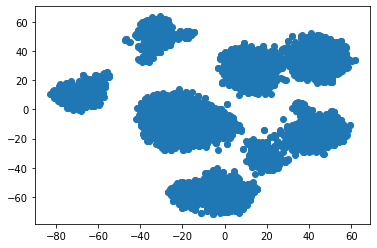

In [46]:
plt.scatter(x = reduced_features[:,0], y=reduced_features[:,1])
plt.show()

In [ ]:
with open("/content/drive/My Drive/Avantari ML/tsne_reduced_features.pkl", 'wb' ) as f : 
    pkl.dump(reduced_features, f)

In [4]:
with open("/content/drive/My Drive/Avantari ML/tsne_reduced_features.pkl", 'rb' ) as f : 
    reduced_features = pkl.load(f)

# Clustering the Data based on Reduced Features

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=500,
       n_clusters=6, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=1997, tol=0.0001, verbose=0)


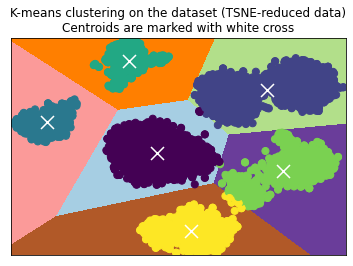

In [19]:
from sklearn.cluster import KMeans

kmeans = KMeans(algorithm='auto', random_state = 1997, max_iter = 500, n_clusters = 6)
print(kmeans)
labels = kmeans.fit_predict(reduced_features)

# Step size of the mesh. Decrease to increase the quality of the VQ.
h = .02     # point in the mesh [x_min, x_max]x[y_min, y_max].
# Plot the decision boundary. For that, we will assign a color to each
x_min, x_max = reduced_features[:, 0].min() - 1, reduced_features[:, 0].max() + 1
y_min, y_max = reduced_features[:, 1].min() - 1, reduced_features[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Obtain labels for each point in mesh. Use last trained model.
Z = kmeans.predict(np.c_[xx.ravel(), yy.ravel()])

# Put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure(1)
plt.clf()
plt.imshow(Z, interpolation='nearest',
           extent=(xx.min(), xx.max(), yy.min(), yy.max()),
           cmap=plt.cm.Paired,
           aspect='auto', origin='lower')
plt.scatter(reduced_features[:, 0], reduced_features[:, 1], c=labels,
            s=50, cmap='viridis')
# Plot the centroids as a white X
# Plot the centroids as a white X
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1],
            marker='x', s=169, linewidths=3,
            color='w', zorder=10)
plt.title('K-means clustering on the dataset (TSNE-reduced data)\n'
          'Centroids are marked with white cross')
plt.xticks(())
plt.yticks(())
plt.show();

In [49]:
with open("/content/drive/My Drive/Avantari ML/kmeans.pkl", 'wb') as f : 
    pkl.dump(kmeans, f)

In [20]:
features_df_with_cluster = features_df.copy()

In [21]:
features_df_with_cluster['cluster'] = labels
features_df_with_cluster['cluster'].unique()

array([3, 1, 0, 4, 5, 2], dtype=int32)

In [53]:
features_df_with_cluster[['ImageName', 'cluster']].to_csv("/content/drive/My Drive/Avantari ML/ImagesWithClusters_kmeans.csv", index = False)

# Visualizing The sample data in each Cluster

In [22]:
cluster_0 = features_df_with_cluster[features_df_with_cluster['cluster'] == 0].reset_index(drop = True)
plot_images(base_image = None, image_df = cluster_0.head(50))

<Figure size 3600x36000 with 0 Axes>

In [23]:
cluster_1 = features_df_with_cluster[features_df_with_cluster['cluster'] == 1].reset_index(drop = True)
plot_images(base_image = None, image_df = cluster_1.head(50))

<Figure size 3600x36000 with 0 Axes>

In [24]:
cluster_2 = features_df_with_cluster[features_df_with_cluster['cluster'] == 2].reset_index(drop = True)
plot_images(base_image = None, image_df = cluster_2.head(50))

<Figure size 3600x36000 with 0 Axes>

In [25]:
cluster_3 = features_df_with_cluster[features_df_with_cluster['cluster'] == 3].reset_index(drop = True)
plot_images(base_image = None, image_df = cluster_3.head(50))

<Figure size 3600x36000 with 0 Axes>

In [26]:
cluster_4 = features_df_with_cluster[features_df_with_cluster['cluster'] == 4].reset_index(drop = True)
plot_images(base_image = None, image_df = cluster_4.head(50))

<Figure size 3600x36000 with 0 Axes>

In [27]:
cluster_5 = features_df_with_cluster[features_df_with_cluster['cluster'] == 5].reset_index(drop = True)
plot_images(base_image = None, image_df = cluster_5.head(50))

<Figure size 3600x36000 with 0 Axes>

GaussianMixture(covariance_type='full', init_params='kmeans', max_iter=100,
                means_init=None, n_components=6, n_init=1, precisions_init=None,
                random_state=1997, reg_covar=1e-06, tol=0.001, verbose=0,
                verbose_interval=10, warm_start=False, weights_init=None)


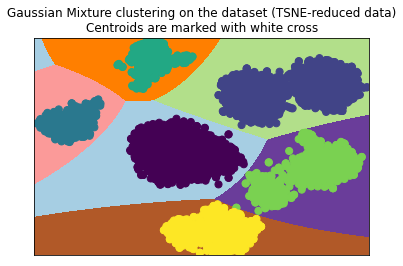

In [5]:
from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=6, random_state = 1997).fit(reduced_features)
print(gmm)
labels = gmm.predict(reduced_features)

# Step size of the mesh. Decrease to increase the quality of the VQ.
h = .02     # point in the mesh [x_min, x_max]x[y_min, y_max].
# Plot the decision boundary. For that, we will assign a color to each
x_min, x_max = reduced_features[:, 0].min() - 1, reduced_features[:, 0].max() + 1
y_min, y_max = reduced_features[:, 1].min() - 1, reduced_features[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Obtain labels for each point in mesh. Use last trained model.
Z = gmm.predict(np.c_[xx.ravel(), yy.ravel()])

# Put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure(1)
plt.clf()
plt.imshow(Z, interpolation='nearest',
           extent=(xx.min(), xx.max(), yy.min(), yy.max()),
           cmap=plt.cm.Paired,
           aspect='auto', origin='lower')
plt.scatter(reduced_features[:, 0], reduced_features[:, 1], c=labels,
            s=50, cmap='viridis')
plt.title('Gaussian Mixture clustering on the dataset (TSNE-reduced data)\n'
          'Centroids are marked with white cross')
plt.xticks(())
plt.yticks(())
plt.show();

In [5]:
with open("/content/drive/My Drive/Avantari ML/gmm.pkl", 'wb') as f : 
    pkl.dump(gmm, f)

In [6]:
features_df_with_cluster = features_df.copy()

In [7]:
features_df_with_cluster['cluster'] = labels
features_df_with_cluster['cluster'].unique()

array([3, 1, 0, 4, 5, 2])

In [12]:
features_df_with_cluster[['ImageName', 'cluster']].to_csv("/content/drive/My Drive/Avantari ML/ImagesWithClusters_gmm.csv", index = False)

In [18]:
cluster_0 = features_df_with_cluster[features_df_with_cluster['cluster'] == 0].reset_index(drop = True)
plot_images(base_image = None, image_df = cluster_0.head(50))

<Figure size 3600x36000 with 0 Axes>

In [9]:
cluster_1 = features_df_with_cluster[features_df_with_cluster['cluster'] == 1].reset_index(drop = True)
plot_images(base_image = None, image_df = cluster_1.head(25), cols = 5)

<Figure size 1800x18000 with 0 Axes>

In [10]:
cluster_2 = features_df_with_cluster[features_df_with_cluster['cluster'] == 2].reset_index(drop = True)
plot_images(base_image = None, image_df = cluster_2.head(25), cols = 5)

<Figure size 1800x18000 with 0 Axes>

In [11]:
cluster_3 = features_df_with_cluster[features_df_with_cluster['cluster'] == 3].reset_index(drop = True)
plot_images(base_image = None, image_df = cluster_3.head(25), cols = 5)

<Figure size 1800x18000 with 0 Axes>

In [12]:
cluster_4 = features_df_with_cluster[features_df_with_cluster['cluster'] == 4].reset_index(drop = True)
plot_images(base_image = None, image_df = cluster_4.head(25), cols = 5)

<Figure size 1800x18000 with 0 Axes>

In [13]:
cluster_5 = features_df_with_cluster[features_df_with_cluster['cluster'] == 5].reset_index(drop = True)
plot_images(base_image = None, image_df = cluster_5.head(25), cols = 5)

<Figure size 1800x18000 with 0 Axes>